## Mount the drive and kaggle on the Google Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

import os
os.environ['KAGGLE_CONFIG_DIR'] = '/root/.kaggle/'

import kaggle
kaggle.api.authenticate()

kaggle.api.dataset_download_files('vellyy/bug-hunter', unzip=True)


Mounted at /content/drive


# Bug Hunter Analysis
Dataset from Kaggle [link](https://www.kaggle.com/datasets/vellyy/bug-hunter/data)

| Abbreviation | Full name                                   | Method | Class | File |
|--------------|--------------------------------------------|--------|-------|------|
| CLOC         | Comment Lines of Code                       | X      | X     | X    |
| LOC          | Lines of Code                               | X      | X     | X    |
| LLOC         | Logical Lines of Code                       | X      | X     | X    |
| NL           | Nesting Level                               | X      |       |      |
| NLE          | Nesting Level Else-If                       | X      |       |      |
| NII          | Number of Incoming Invocations              | X      |       |      |
| NOI          | Number of Outgoing Invocations              | X      |       |      |
| CD           | Comment Density                             | X      |       |      |
| DLOC         | Documentation Lines of Code                 | X      |       |      |
| TCD          | Total Comment Density                       | X      |       |      |
| TCLOC        | Total Comment Lines of Code                 | X      |       |      |
| NOS          | Number of Statements                        | X      |       |      |
| TLOC         | Total Lines of Code                         | X      |       |      |
| TLLOC        | Total Logical Lines of Code                 | X      |       |      |
| TNOS         | Total Number of Statements                  | X      |       |      |
| McCC         | McCabe’s Cyclomatic Complexity              | X      | X     |      |
| PDA          | Public Documented API                       |        | X     | X    |
| PUA          | Public Undocumented API                     |        | X     | X    |
| HCPL         | Halstead Calculated Program Length          | X      |       |      |
| HDIF         | Halstead Difficulty                         | X      |       |      |
| HEFF         | Halstead Effort                             | X      |       |      |
| HNDB         | Halstead Number of Delivered Bugs           | X      |       |      |
| HPL          | Halstead Program Length                     | X      |       |      |
| HPV          | Halstead Program Vocabulary                 | X      |       |      |
| HTRP         | Halstead Time Required to Program           | X      |       |      |
| HVOL         | Halstead Volume                             | X      |       |      |
| MIMS         | Maintainability Index (Microsoft version)   | X      |       |      |
| MI           | Maintainability Index (Original version)    | X      |       |      |
| MISEI        | Maintainability Index (SEI version)         | X      |       |      |
| MISM         | Maintainability Index (SourceMeter version) | X      |       |      |
| NUMPAR       | Number of Parameters                        | X      |       |      |
| LCOM5        | Lack of Cohesion in Methods 5               | X      | X     |      |
| WMC          | Weighted Methods per Class                  | X      | X     |      |
| CBO          | Coupling Between Object classes             | X      | X     |      |
| CBOI         | Coupling Between Object classes Inverse     | X      | X     |      |
| RFC          | Response set For Class                       | X      | X     |      |
| AD           | API Documentation                           |        | X     |      |
| DIT          | Depth of Inheritance Tree                   | X      | X     |      |
| NOA          | Number of Ancestors                         | X      | X     |      |
| NOC          | Number of Children                          | X      | X     |      |
| NOD          | Number of Descendants                       | X      | X     |      |
| NOP          | Number of Parents                           | X      | X     |      |
| NA           | Number of Attributes                        | X      | X     |      |
| NG           | Number of Getters                           | X      | X     |      |
| NLA          | Number of Local Attributes                  | X      | X     |      |
| NLG          | Number of Local Getters                      | X      | X     |      |
| NLM          | Number of Local Methods                      | X      | X     |      |
| NLPA         | Number of Local Public Attributes            | X      | X     |      |
| NLPM         | Number of Local Public Methods               | X      | X     |      |
| NLS          | Number of Local Setters                      | X      | X     |      |
| NM           | Number of Methods                           | X      | X     |      |
| NPA          | Number of Public Attributes                  | X      | X     |      |
| NPM          | Number of Public Methods                     | X      | X     |      |
| NS           | Number of Setters                           | X      | X     |      |
| TNA          | Total Number of Attributes                   | X      | X     |      |
| TNG          | Total Number of Getters                      | X      | X     |      |
| TNLA         | Total Number of Local Attributes             | X      | X     |      |
| TNLG         | Total Number of Local Getters                 | X      | X     |      |
| TNLM         | Total Number of Local Methods                 | X      | X     |      |
| TNLPA        | Total Number of Local Public Attributes       | X      | X     |      |
| TNLPM        | Total Number of Local Public Methods          | X      | X     |      |
| TNLS         | Total Number of Local Setters                 | X      | X     |      |
| TNM          | Total Number of Methods                       | X      | X     |      |
| TNPA         | Total Number of Public Attributes              | X      | X     |      |
| TNPM         | Total Number of Public Methods                 | X      | X     |      |
| TNS          | Total Number of Setters                        | X      | X     |      |


### Importing modules and liberaries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


## Reading Dataset

In [3]:
df = pd.read_csv('/content/class.csv')
print(df.shape)
df.head()


(84562, 99)


,Project,Hash,LongName,CC,CCL,CCO,CI,CLC,CLLC,LDC,...,Migration15 Rules,Naming Rules,Optimization Rules,Security Code Guideline Rules,Strict Exception Rules,String and StringBuffer Rules,Type Resolution Rules,Unnecessary and Unused Code Rules,Vulnerability Rules,Number of Bugs
0,antlr4,b4a53d56d4324739e823344237c4d7fdf6cac90c,org.antlr.v4.semantics.SymbolCollector,0.000000,0,0,0,0.000000,0.000000,0,...,0,9,0,0,0,0,0,0,0,1
1,antlr4,dc2c9b039e1497ad924c852e07f3a8f981ed078b,org.antlr.v4.test.tool.TestActionTranslation,0.032441,2,2,2,0.047297,0.055851,21,...,0,2,0,0,0,8,95,56,0,1
2,antlr4,6de95c15e73d7bb092b1519405cd0f1859e63e8b,org.antlr.v4.test.TestSemPredEvalParser,0.761986,23,55,55,0.695187,0.791111,390,...,0,0,0,0,0,10,22,1,0,0
3,antlr4,6de95c15e73d7bb092b1519405cd0f1859e63e8b,org.antlr.v4.runtime.atn.ParserATNSimulator,0.040439,1,6,2,0.031144,0.043133,46,...,0,15,0,1,0,0,0,0,0,0
4,antlr4,a6e7a72ac767d73e6f760750b53b13e2e89d7261,org.antlr.v4.runtime.Recognizer,0.000000,0,0,0,0.000000,0.000000,0,...,0,9,0,0,1,0,0,0,0,1


In [4]:
df.columns


Index(['Project', 'Hash', 'LongName', 'CC', 'CCL', 'CCO', 'CI', 'CLC', 'CLLC',
       'LDC', 'LLDC', 'LCOM5', 'NL', 'NLE', 'WMC', 'CBO', 'CBOI', 'NII', 'NOI',
       'RFC', 'AD', 'CD', 'CLOC', 'DLOC', 'PDA', 'PUA', 'TCD', 'TCLOC', 'DIT',
       'NOA', 'NOC', 'NOD', 'NOP', 'LLOC', 'LOC', 'NA', 'NG', 'NLA', 'NLG',
       'NLM', 'NLPA', 'NLPM', 'NLS', 'NM', 'NOS', 'NPA', 'NPM', 'NS', 'TLLOC',
       'TLOC', 'TNA', 'TNG', 'TNLA', 'TNLG', 'TNLM', 'TNLPA', 'TNLPM', 'TNLS',
       'TNM', 'TNOS', 'TNPA', 'TNPM', 'TNS', 'WarningBlocker',
       'WarningCritical', 'WarningInfo', 'WarningMajor', 'WarningMinor',
       'Android Rules', 'Basic Rules', 'Brace Rules',
       'Clone Implementation Rules', 'Code Size Rules', 'Comment Rules',
       'Controversial Rules', 'Coupling Rules', 'Design Rules',
       'Empty Code Rules', 'Finalizer Rules', 'Import Statement Rules',
       'J2EE Rules', 'JUnit Rules', 'Jakarta Commons Logging Rules',
       'Java Logging Rules', 'JavaBean Rules', 'MigratingToJ

## EDA

In [5]:
df.isnull().sum()

Project                              0
Hash                                 0
LongName                             0
CC                                   0
CCL                                  0
                                    ..
String and StringBuffer Rules        0
Type Resolution Rules                0
Unnecessary and Unused Code Rules    0
Vulnerability Rules                  0
Number of Bugs                       0
Length: 99, dtype: int64

In [6]:
cnt = 0
for col in df.columns:
  if df[col].isnull().sum() != 0:
    cnt = cnt + 1

print(cnt)


0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84562 entries, 0 to 84561
Data columns (total 99 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Project                            84562 non-null  object 
 1   Hash                               84562 non-null  object 
 2   LongName                           84562 non-null  object 
 3   CC                                 84562 non-null  float64
 4   CCL                                84562 non-null  int64  
 5   CCO                                84562 non-null  int64  
 6   CI                                 84562 non-null  int64  
 7   CLC                                84562 non-null  float64
 8   CLLC                               84562 non-null  float64
 9   LDC                                84562 non-null  int64  
 10  LLDC                               84562 non-null  int64  
 11  LCOM5                              84562 non-null  int

In [8]:
for col in df.columns:
  print(f'{col} -> {len(df[col].unique())}')


Project -> 15
Hash -> 13619
LongName -> 21571
CC -> 21724
CCL -> 149
CCO -> 410
CI -> 262
CLC -> 13847
CLLC -> 12362
LDC -> 840
LLDC -> 720
LCOM5 -> 84
NL -> 50
NLE -> 19
WMC -> 574
CBO -> 192
CBOI -> 592
NII -> 891
NOI -> 338
RFC -> 463
AD -> 1006
CD -> 12903
CLOC -> 469
DLOC -> 376
PDA -> 85
PUA -> 183
TCD -> 14689
TCLOC -> 515
DIT -> 10
NOA -> 16
NOC -> 170
NOD -> 244
NOP -> 13
LLOC -> 1888
LOC -> 2300
NA -> 159
NG -> 96
NLA -> 131
NLG -> 92
NLM -> 223
NLPA -> 120
NLPM -> 190
NLS -> 54
NM -> 331
NOS -> 1360
NPA -> 139
NPM -> 254
NS -> 61
TLLOC -> 2090
TLOC -> 2536
TNA -> 186
TNG -> 136
TNLA -> 158
TNLG -> 95
TNLM -> 275
TNLPA -> 140
TNLPM -> 222
TNLS -> 55
TNM -> 499
TNOS -> 1467
TNPA -> 160
TNPM -> 396
TNS -> 85
WarningBlocker -> 2
WarningCritical -> 68
WarningInfo -> 1
WarningMajor -> 176
WarningMinor -> 540
Android Rules -> 1
Basic Rules -> 47
Brace Rules -> 278
Clone Implementation Rules -> 5
Code Size Rules -> 1
Comment Rules -> 1
Controversial Rules -> 80
Coupling Rules -> 1
D

### Insights of the dataset upto this point is given below -
- This dataset contains 15 types of different datasets.
- Along with that it contains 1 more dataset in every dataset with named `all` which contains all the combined entries of the dataset including `class`, `file`, `method-p`, and `method`.
- But there is another directory with other directories named `full` which contains full dataset of each category of the commits.
- So, just analyse the dataset `full/all` which contains all the dataset with all commits and entries.

#### Let's start it.

### Let's start reading the dataset

In [9]:
# Dataset path - '/content/BugHunterDataset-1.0/full/all/class.csv'
classes = pd.read_csv('/content/BugHunterDataset-1.0/full/all/class.csv')
print(classes.shape)
classes.head()


(84562, 99)


,Project,Hash,LongName,CC,CCL,CCO,CI,CLC,CLLC,LDC,...,Migration15 Rules,Naming Rules,Optimization Rules,Security Code Guideline Rules,Strict Exception Rules,String and StringBuffer Rules,Type Resolution Rules,Unnecessary and Unused Code Rules,Vulnerability Rules,Number of Bugs
0,antlr4,b4a53d56d4324739e823344237c4d7fdf6cac90c,org.antlr.v4.semantics.SymbolCollector,0.000000,0,0,0,0.000000,0.000000,0,...,0,9,0,0,0,0,0,0,0,1
1,antlr4,dc2c9b039e1497ad924c852e07f3a8f981ed078b,org.antlr.v4.test.tool.TestActionTranslation,0.032441,2,2,2,0.047297,0.055851,21,...,0,2,0,0,0,8,95,56,0,1
2,antlr4,6de95c15e73d7bb092b1519405cd0f1859e63e8b,org.antlr.v4.test.TestSemPredEvalParser,0.761986,23,55,55,0.695187,0.791111,390,...,0,0,0,0,0,10,22,1,0,0
3,antlr4,6de95c15e73d7bb092b1519405cd0f1859e63e8b,org.antlr.v4.runtime.atn.ParserATNSimulator,0.040439,1,6,2,0.031144,0.043133,46,...,0,15,0,1,0,0,0,0,0,0
4,antlr4,a6e7a72ac767d73e6f760750b53b13e2e89d7261,org.antlr.v4.runtime.Recognizer,0.000000,0,0,0,0.000000,0.000000,0,...,0,9,0,0,1,0,0,0,0,1


In [10]:
classes.columns


Index(['Project', 'Hash', 'LongName', 'CC', 'CCL', 'CCO', 'CI', 'CLC', 'CLLC',
       'LDC', 'LLDC', 'LCOM5', 'NL', 'NLE', 'WMC', 'CBO', 'CBOI', 'NII', 'NOI',
       'RFC', 'AD', 'CD', 'CLOC', 'DLOC', 'PDA', 'PUA', 'TCD', 'TCLOC', 'DIT',
       'NOA', 'NOC', 'NOD', 'NOP', 'LLOC', 'LOC', 'NA', 'NG', 'NLA', 'NLG',
       'NLM', 'NLPA', 'NLPM', 'NLS', 'NM', 'NOS', 'NPA', 'NPM', 'NS', 'TLLOC',
       'TLOC', 'TNA', 'TNG', 'TNLA', 'TNLG', 'TNLM', 'TNLPA', 'TNLPM', 'TNLS',
       'TNM', 'TNOS', 'TNPA', 'TNPM', 'TNS', 'WarningBlocker',
       'WarningCritical', 'WarningInfo', 'WarningMajor', 'WarningMinor',
       'Android Rules', 'Basic Rules', 'Brace Rules',
       'Clone Implementation Rules', 'Code Size Rules', 'Comment Rules',
       'Controversial Rules', 'Coupling Rules', 'Design Rules',
       'Empty Code Rules', 'Finalizer Rules', 'Import Statement Rules',
       'J2EE Rules', 'JUnit Rules', 'Jakarta Commons Logging Rules',
       'Java Logging Rules', 'JavaBean Rules', 'MigratingToJ

In [11]:
files = pd.read_csv('/content/BugHunterDataset-1.0/full/all/file.csv')
print(files.shape)
files.head()


(70088, 10)


,Project,Hash,LongName,McCC,CLOC,PDA,PUA,LLOC,LOC,Number of Bugs
0,antlr4,78427bae798f4e171fcc416cd796211e57ac45b8,tool/src/org/antlr/v4/semantics/BasicSemanticC...,84,0,2,19,466,638,1
1,antlr4,b7e5bfcbf8c9a773b9a5eb7d36a5d790241e89d6,tool/src/org/antlr/v4/analysis/LeftRecursiveRu...,56,0,6,13,318,435,1
2,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,tool/src/org/antlr/v4/misc/EscapeSequenceParsi...,26,0,2,6,136,172,0
3,antlr4,fdc46c53e6d885307d0ff3f8ceea5474267d1f64,tool/test/org/antlr/v4/test/TestParserExec.java,1,0,14,14,360,531,2
4,antlr4,2da28ee5b23aa18d907625cde54cf7d71cd68801,runtime/Java/src/org/antlr/v4/runtime/Parser.java,73,0,33,34,548,1048,0


In [12]:
methodp = pd.read_csv('/content/BugHunterDataset-1.0/full/all/method-p.csv')
print(methodp.shape)
methodp.head()


(159078, 77)


,Project,Hash,LongName,Parent,CC,CCL,CCO,CI,CLC,CLLC,...,Migration15 Rules,Naming Rules,Optimization Rules,Security Code Guideline Rules,Strict Exception Rules,String and StringBuffer Rules,Type Resolution Rules,Unnecessary and Unused Code Rules,Vulnerability Rules,Number of Bugs
0,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,org.antlr.v4.test.tool.TestEscapeSequenceParsi...,org.antlr.v4.test.tool.TestEscapeSequenceParsing,0.0,0,0,0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,org.antlr.v4.test.tool.TestEscapeSequenceParsi...,org.antlr.v4.test.tool.TestEscapeSequenceParsing,0.0,0,0,0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,org.antlr.v4.test.tool.TestEscapeSequenceParsi...,org.antlr.v4.test.tool.TestEscapeSequenceParsing,0.0,0,0,0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,antlr4,fe5f93a0f49c9baca453ded501f9fee4b42f3fa8,org.antlr.v4.tool.GrammarTransformPipeline.ext...,org.antlr.v4.tool.GrammarTransformPipeline,0.0,0,0,0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
4,antlr4,05f4b76fab637e118dc3172f067c5f60ad131412,org.antlr.v4.automata.LexerATNFactory.lexerCal...,org.antlr.v4.automata.LexerATNFactory,0.0,0,0,0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,1


In [13]:
method = pd.read_csv('/content/BugHunterDataset-1.0/full/all/method.csv')
print(method.shape)
method.head()


(159078, 76)


,Project,Hash,LongName,CC,CCL,CCO,CI,CLC,CLLC,LDC,...,Migration15 Rules,Naming Rules,Optimization Rules,Security Code Guideline Rules,Strict Exception Rules,String and StringBuffer Rules,Type Resolution Rules,Unnecessary and Unused Code Rules,Vulnerability Rules,Number of Bugs
0,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,org.antlr.v4.test.tool.TestEscapeSequenceParsi...,0.0,0,0,0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
1,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,org.antlr.v4.test.tool.TestEscapeSequenceParsi...,0.0,0,0,0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
2,antlr4,8af00801037d3b8933f29d0903daac3e9c05349e,org.antlr.v4.test.tool.TestEscapeSequenceParsi...,0.0,0,0,0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
3,antlr4,fe5f93a0f49c9baca453ded501f9fee4b42f3fa8,org.antlr.v4.tool.GrammarTransformPipeline.ext...,0.0,0,0,0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,1
4,antlr4,05f4b76fab637e118dc3172f067c5f60ad131412,org.antlr.v4.automata.LexerATNFactory.lexerCal...,0.0,0,0,0,0.0,0.0,0,...,0,1,0,0,0,0,0,0,0,1


### Analyse the dataset

In [14]:
projects = classes.Project.unique()
projects


array(['antlr4', 'Android-Universal-Image-Loader', 'BroadleafCommerce',
       'ceylon-ide-eclipse', 'oryx', 'titan', 'mct', 'junit', 'MapDB',
       'mcMMO', 'neo4j', 'orientdb', 'hazelcast', 'elasticsearch',
       'netty'], dtype=object)

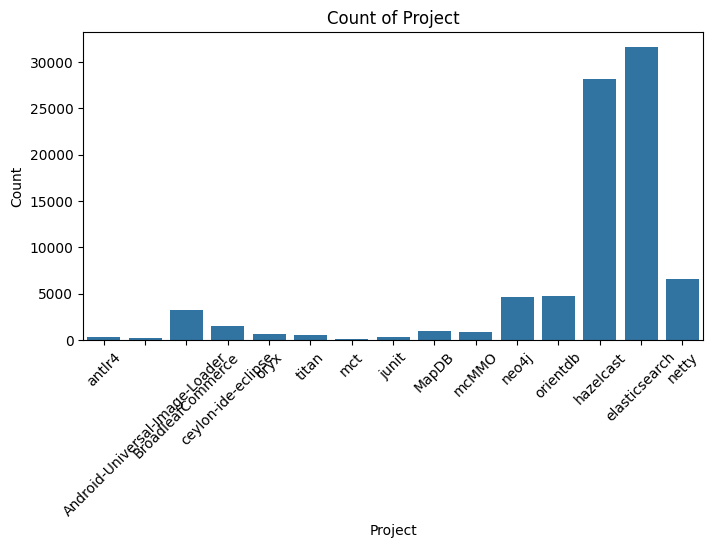

In [15]:
for column in ['Project']:
  plt.figure(figsize=(8, 4))
  sns.countplot(data=classes, x=column)
  plt.title(f'Count of {column}')
  plt.xlabel(column)
  plt.ylabel('Count')
  plt.xticks(rotation=45)
  plt.show()


In [16]:
len(classes.Hash.unique())


13619

According to the dataset,
- 35507/34581 = 1.03 and on addition 35507 + 34581 = 70088 (Entries of `file` dataset)
- 41098/43475 = 0.98 and on addition 41098 + 43475 = 84573 (Entries of `class` dataset)
- 58810/100268 = 0.59 and on addition 58810 + 100268 = 159078 (Entries of `method` dataset)


##### Description of the features


In [17]:
pd.set_option('display.max_rows',100)
summary = classes.describe().T
summary


,count,mean,std,min,25%,50%,75%,max
CC,84562.0,0.134423,0.244580,0.0,0.0,0.000000,0.167372,1.000000
CCL,84562.0,2.458161,16.410599,0.0,0.0,0.000000,2.000000,499.000000
CCO,84562.0,15.311913,400.076061,0.0,0.0,0.000000,6.000000,75576.000000
CI,84562.0,6.365436,78.301175,0.0,0.0,0.000000,2.000000,4735.000000
CLC,84562.0,0.117876,0.225439,0.0,0.0,0.000000,0.138889,1.000000
CLLC,84562.0,0.125763,0.232476,0.0,0.0,0.000000,0.156250,1.000000
LDC,84562.0,42.794506,237.198409,0.0,0.0,0.000000,26.000000,8282.000000
LLDC,84562.0,37.816419,216.424844,0.0,0.0,0.000000,23.000000,8236.000000
LCOM5,84562.0,2.410373,4.180393,0.0,1.0,1.000000,2.000000,129.000000
NL,84562.0,2.413141,3.221344,0.0,1.0,2.000000,3.000000,84.000000


#### Let's apply encoding on `Project` feature of the dataset

In [18]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
classes['Project'] = encoder.fit_transform(classes['Project'])
classes.head()


,Project,Hash,LongName,CC,CCL,CCO,CI,CLC,CLLC,LDC,...,Migration15 Rules,Naming Rules,Optimization Rules,Security Code Guideline Rules,Strict Exception Rules,String and StringBuffer Rules,Type Resolution Rules,Unnecessary and Unused Code Rules,Vulnerability Rules,Number of Bugs
0,3,b4a53d56d4324739e823344237c4d7fdf6cac90c,org.antlr.v4.semantics.SymbolCollector,0.000000,0,0,0,0.000000,0.000000,0,...,0,9,0,0,0,0,0,0,0,1
1,3,dc2c9b039e1497ad924c852e07f3a8f981ed078b,org.antlr.v4.test.tool.TestActionTranslation,0.032441,2,2,2,0.047297,0.055851,21,...,0,2,0,0,0,8,95,56,0,1
2,3,6de95c15e73d7bb092b1519405cd0f1859e63e8b,org.antlr.v4.test.TestSemPredEvalParser,0.761986,23,55,55,0.695187,0.791111,390,...,0,0,0,0,0,10,22,1,0,0
3,3,6de95c15e73d7bb092b1519405cd0f1859e63e8b,org.antlr.v4.runtime.atn.ParserATNSimulator,0.040439,1,6,2,0.031144,0.043133,46,...,0,15,0,1,0,0,0,0,0,0
4,3,a6e7a72ac767d73e6f760750b53b13e2e89d7261,org.antlr.v4.runtime.Recognizer,0.000000,0,0,0,0.000000,0.000000,0,...,0,9,0,0,1,0,0,0,0,1


##### Remove the Object type features

In [19]:
def removeObjFeat(df, col):
  df.drop(col, axis = 1, inplace = True)
  return df

col = ["LongName"]
classes = removeObjFeat(classes, col)
files = removeObjFeat(files, col)
methodp = removeObjFeat(methodp, col)
method = removeObjFeat(method, col)

print(classes.shape)
print(files.shape)
print(methodp.shape)
print(method.shape)


(84562, 98)
(70088, 9)
(159078, 76)
(159078, 75)


#### Let's remove those features which contains only 1 uniques values

In [20]:
def removeUniqueFeatures(df):
  uniqueFeatures = df.columns[df.nunique() == 1]
  df = df.drop(columns=uniqueFeatures)
  return df

classes = removeUniqueFeatures(classes)
files = removeUniqueFeatures(files)
methodp = removeUniqueFeatures(methodp)
method = removeUniqueFeatures(method)

print(classes.shape)
print(files.shape)
print(methodp.shape)
print(method.shape)


(84562, 89)
(70088, 8)
(159078, 66)
(159078, 65)


### Univariate Analysis

##### Numerical features

In [21]:
numerical = classes.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical


['Project',
 'CC',
 'CCL',
 'CCO',
 'CI',
 'CLC',
 'CLLC',
 'LDC',
 'LLDC',
 'LCOM5',
 'NL',
 'NLE',
 'WMC',
 'CBO',
 'CBOI',
 'NII',
 'NOI',
 'RFC',
 'AD',
 'CD',
 'CLOC',
 'DLOC',
 'PDA',
 'PUA',
 'TCD',
 'TCLOC',
 'DIT',
 'NOA',
 'NOC',
 'NOD',
 'NOP',
 'LLOC',
 'LOC',
 'NA',
 'NG',
 'NLA',
 'NLG',
 'NLM',
 'NLPA',
 'NLPM',
 'NLS',
 'NM',
 'NOS',
 'NPA',
 'NPM',
 'NS',
 'TLLOC',
 'TLOC',
 'TNA',
 'TNG',
 'TNLA',
 'TNLG',
 'TNLM',
 'TNLPA',
 'TNLPM',
 'TNLS',
 'TNM',
 'TNOS',
 'TNPA',
 'TNPM',
 'TNS',
 'WarningBlocker',
 'WarningCritical',
 'WarningMajor',
 'WarningMinor',
 'Basic Rules',
 'Brace Rules',
 'Clone Implementation Rules',
 'Controversial Rules',
 'Design Rules',
 'Empty Code Rules',
 'Finalizer Rules',
 'Import Statement Rules',
 'J2EE Rules',
 'JUnit Rules',
 'Jakarta Commons Logging Rules',
 'Java Logging Rules',
 'JavaBean Rules',
 'Migration Rules',
 'Naming Rules',
 'Optimization Rules',
 'Security Code Guideline Rules',
 'Strict Exception Rules',
 'String and Strin

#### Visualize the different features distribution

In [22]:
def plotGraph(col, bins=30, bandwidth=None):
  fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

  sns.histplot(col, bins=bins, kde=True, color='skyblue', alpha=0.7, ax=axes[0])
  axes[0].set_title(f'Distribution of {col.name}')
  axes[0].set_xlabel(f'{col.name} values')
  axes[0].set_ylabel('Count')

  sns.kdeplot(col, color='blue', fill=True, bw_adjust=bandwidth if bandwidth is not None else 1.0, ax=axes[1])
  axes[1].set_title(f'Kernel Density Estimate (KDE) plot of {col.name}')
  axes[1].set_xlabel(f'{col.name} values')
  axes[1].set_ylabel('Density')

  sns.boxplot(x=col, color='lightgray', width=0.3, linewidth=2, fliersize=5, ax=axes[2])
  axes[2].set_title(f'Box Plot of {col.name}')
  axes[2].set_xlabel(f'{col.name} values')
  axes[2].set_ylabel('Value')

  plt.savefig(f'{col.name}_plot.jpg', format='jpg')

  plt.tight_layout()
  plt.show()


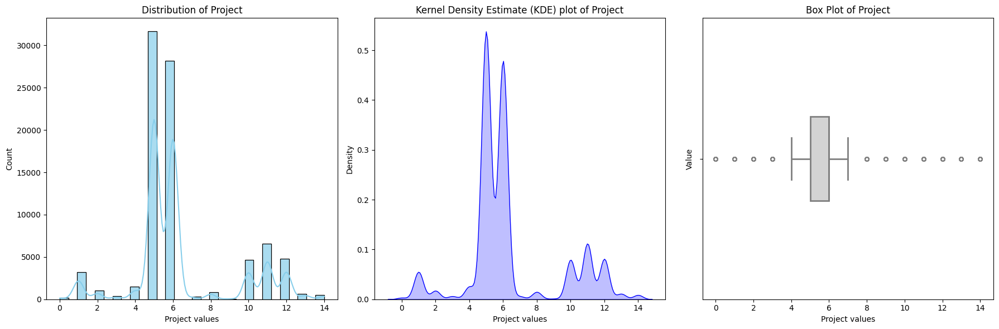

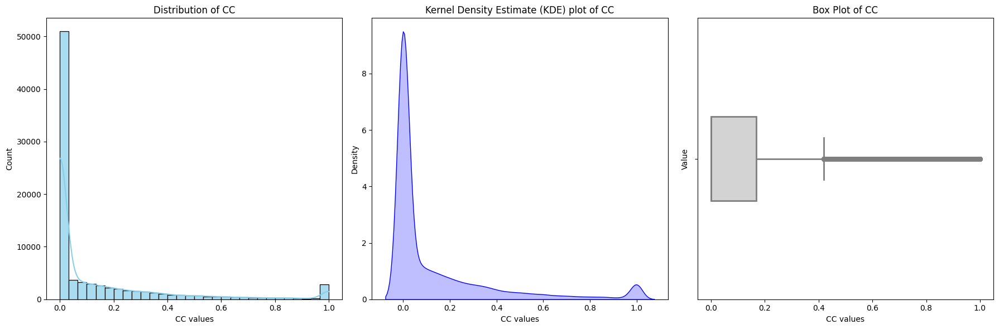

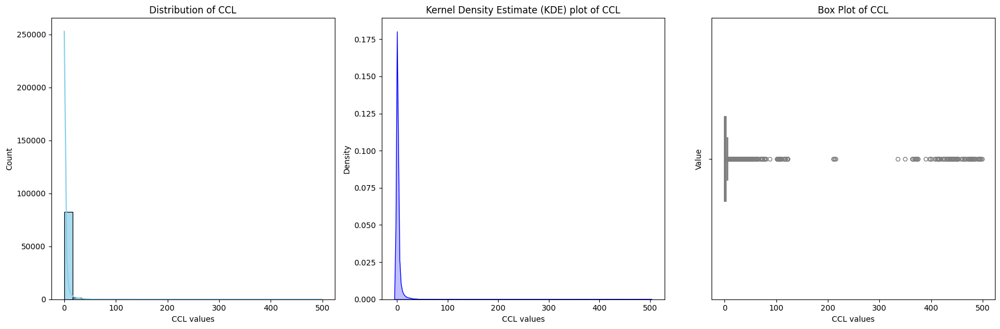

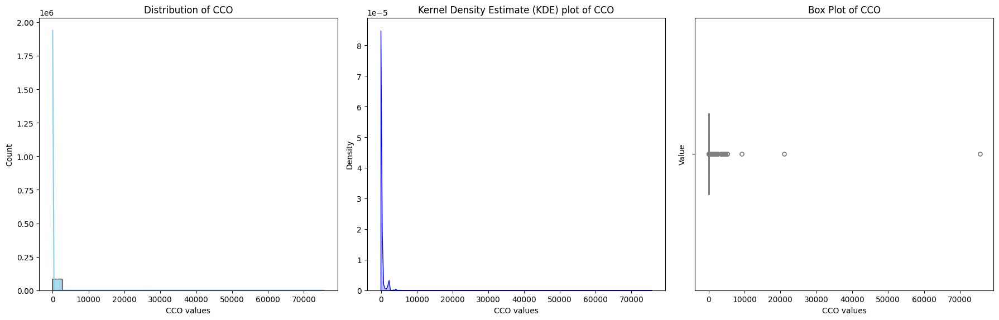

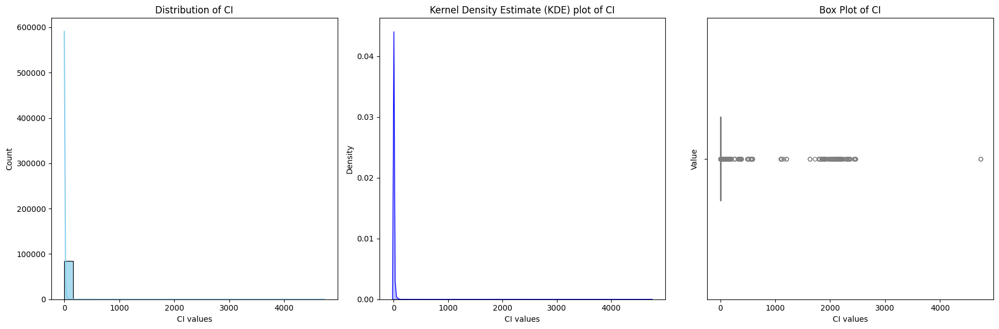

...

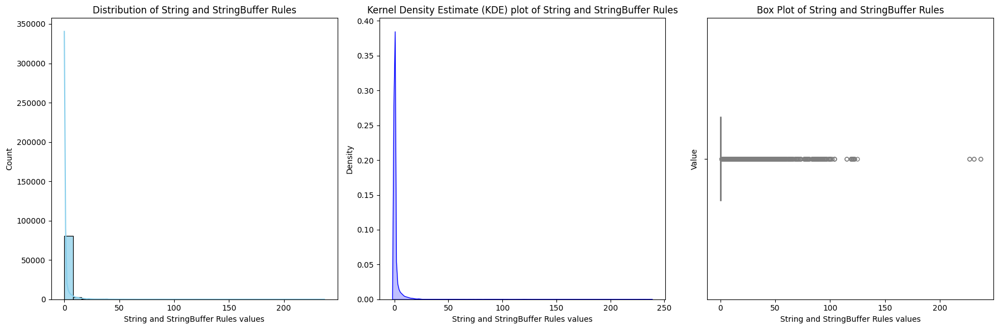

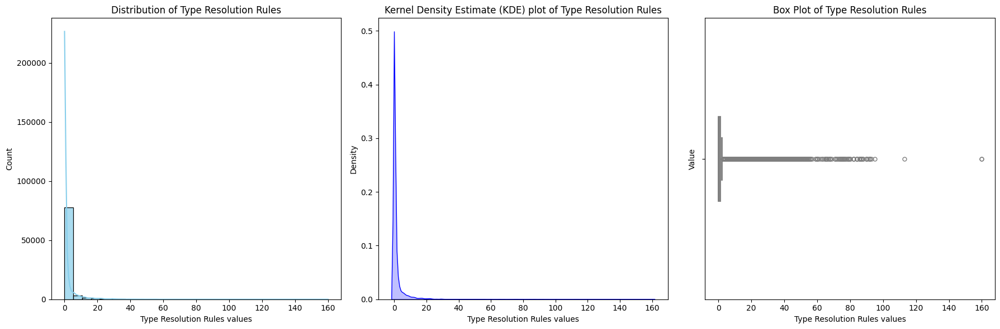

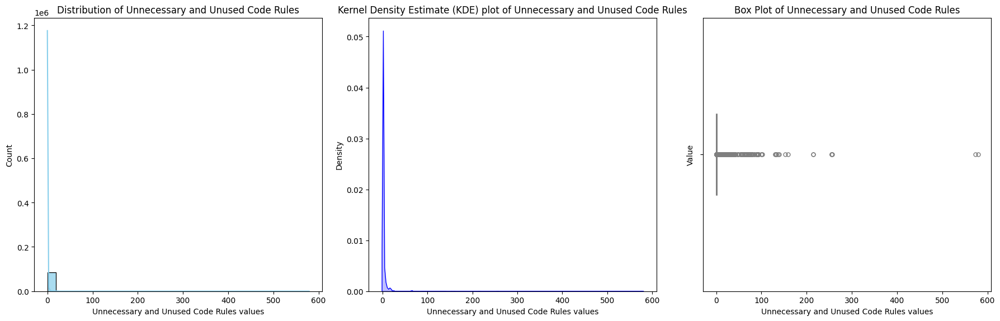

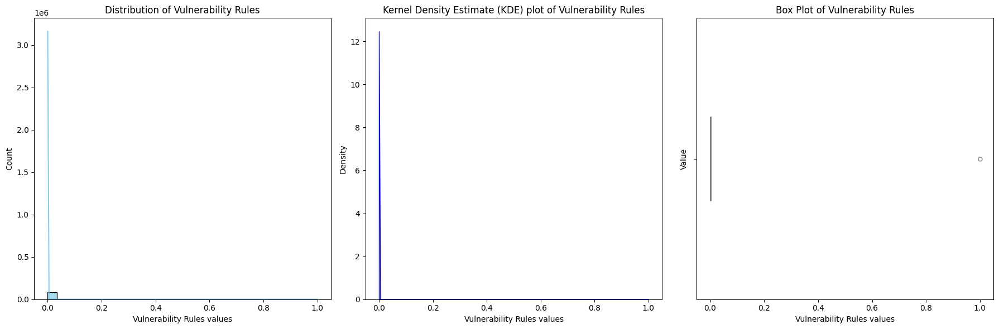

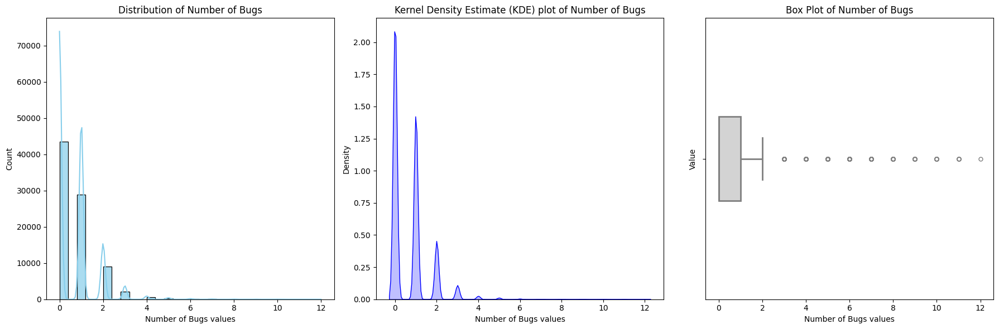

In [23]:
for col in numerical:
  plotGraph(classes[col])


#### Remove the outliers

In [24]:
from scipy import stats

def removeOutliers(df):
  z_scores = stats.zscore(df.select_dtypes(include=['int64', 'float64']))
  abs_z_scores = np.abs(z_scores)
  filtered = (abs_z_scores < 1.75).all(axis=1)
  df = df[filtered]
  return df

classes = removeOutliers(classes)
files = removeOutliers(files)
methodp = removeOutliers(methodp)
method = removeOutliers(method)

print(classes.shape)
print(files.shape)
print(methodp.shape)
print(method.shape)


(31771, 89)
(60278, 8)
(64599, 66)
(64599, 65)


##### Let's remove those features which contains only 1 uniques values

In [25]:
classes = removeUniqueFeatures(classes)
files = removeUniqueFeatures(files)
methodp = removeUniqueFeatures(methodp)
method = removeUniqueFeatures(method)

print(classes.shape)
print(files.shape)
print(methodp.shape)
print(method.shape)


(31771, 82)
(60278, 8)
(64599, 50)
(64599, 49)


##### Let's again visualize the dataset

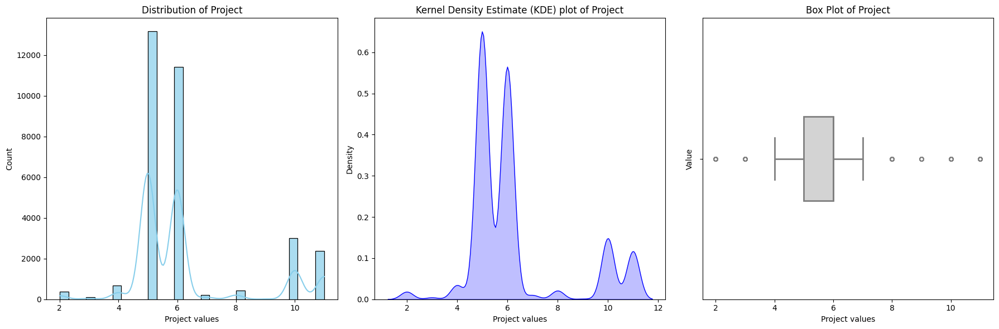

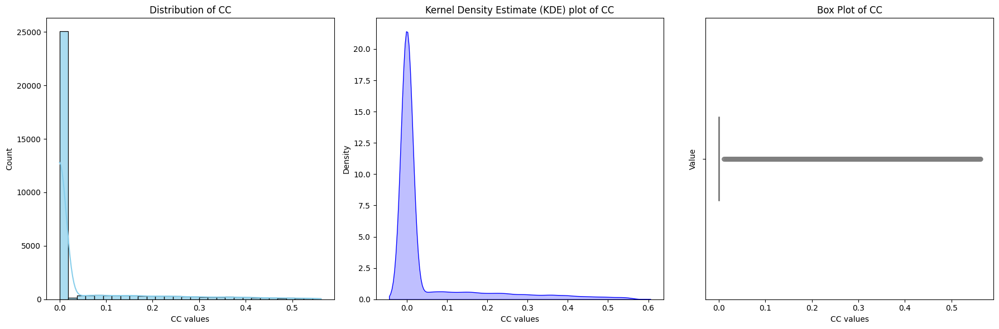

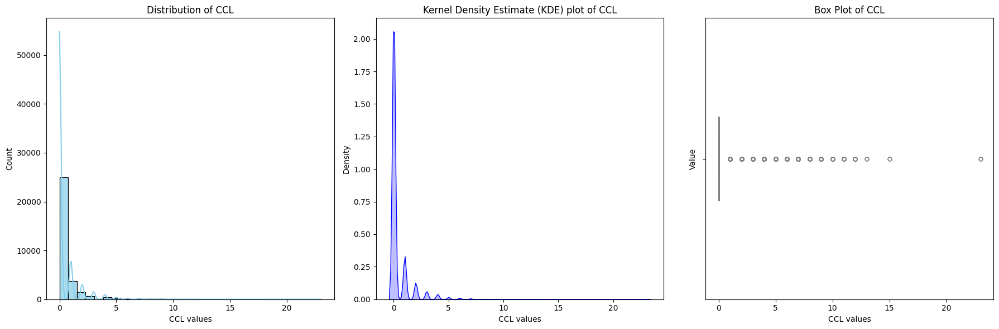

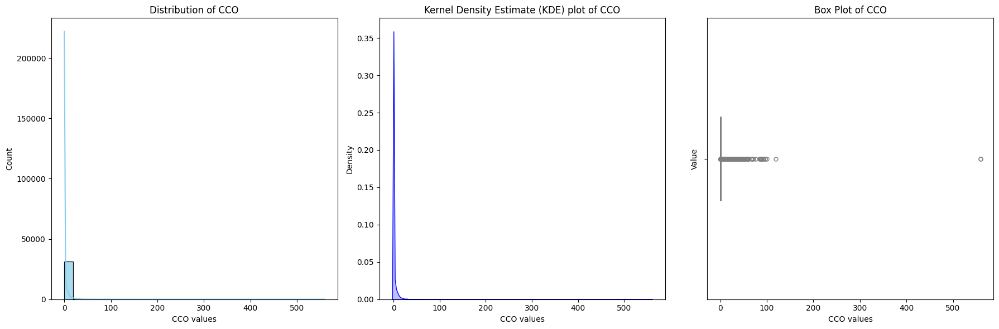

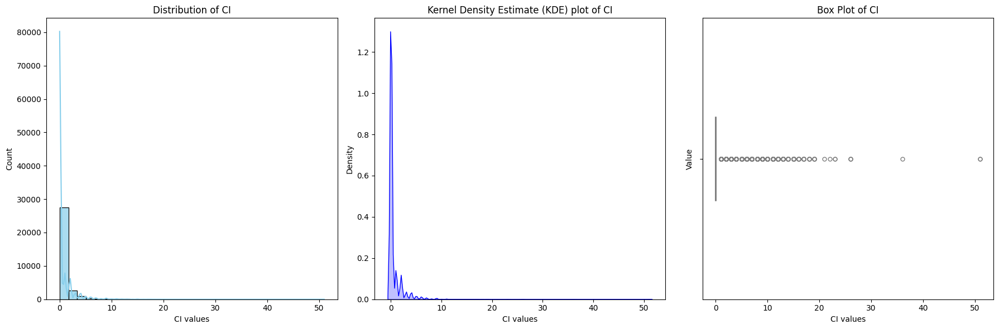

...

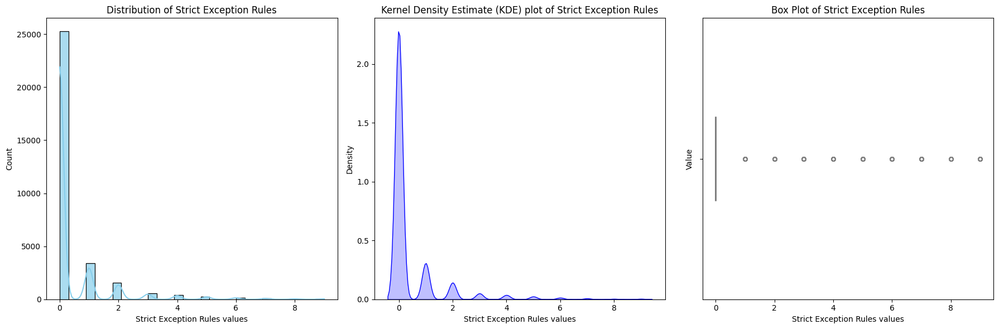

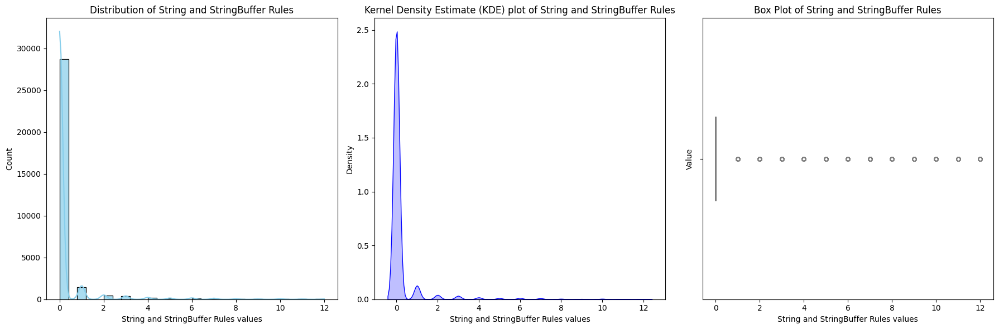

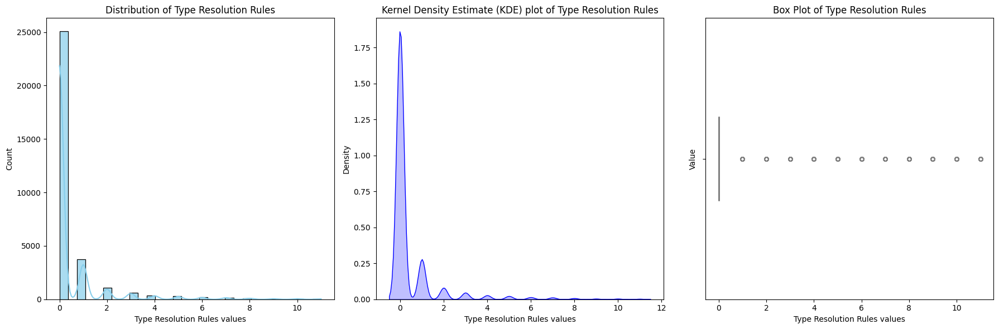

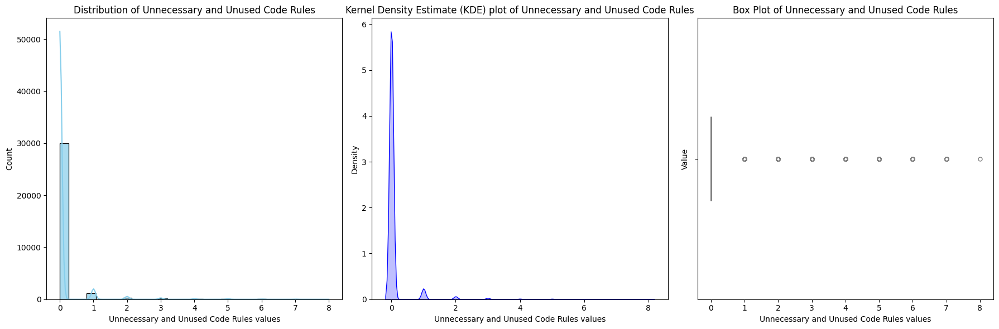

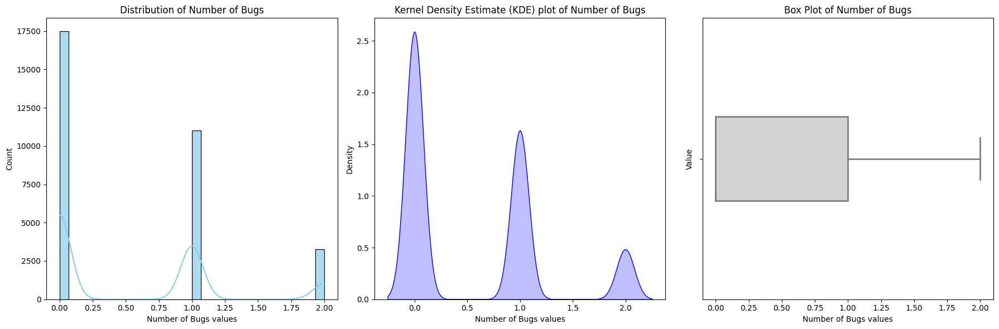

In [26]:
numerical = classes.select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in numerical:
  plotGraph(classes[col])


####Numerical Variables vs. Target Variable:

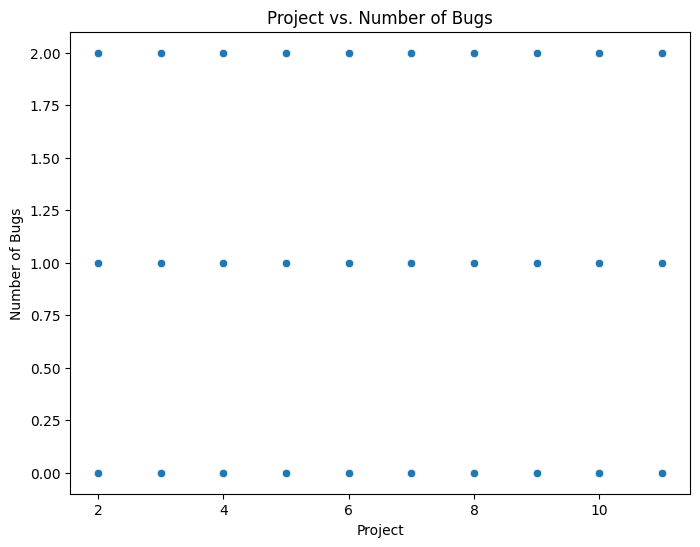

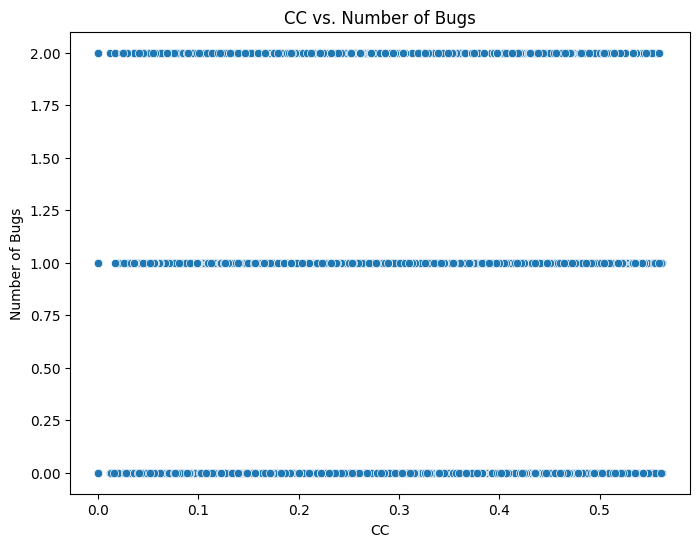

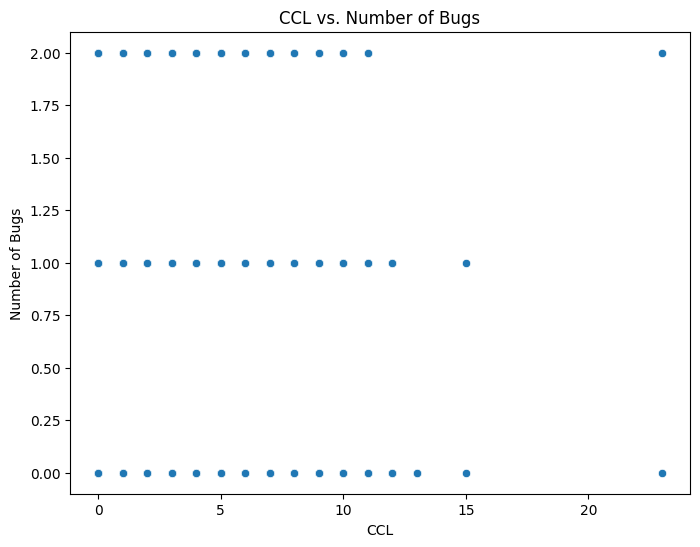

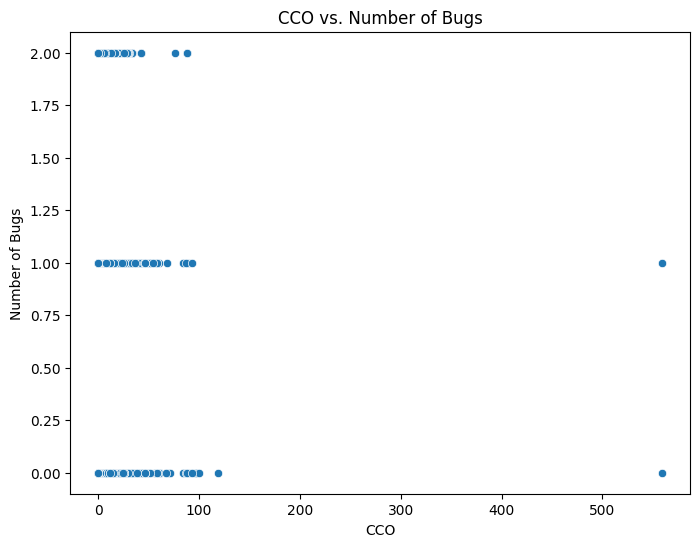

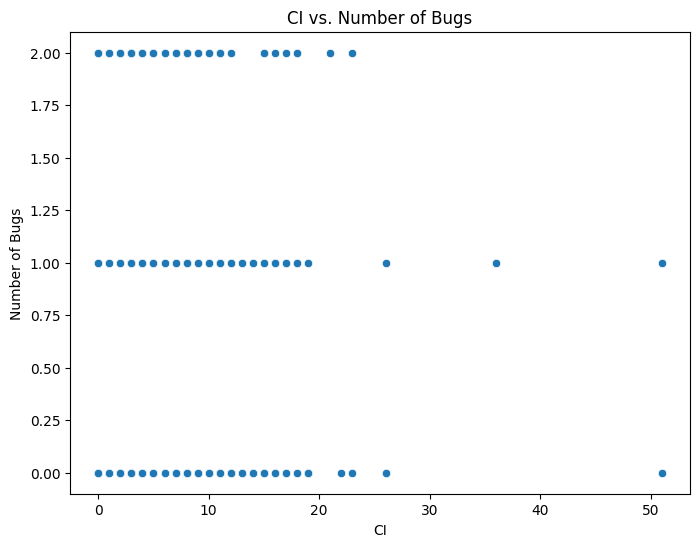

...

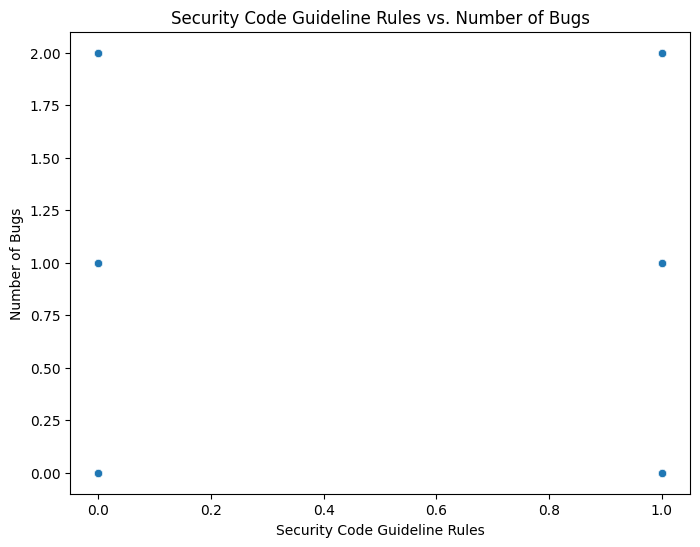

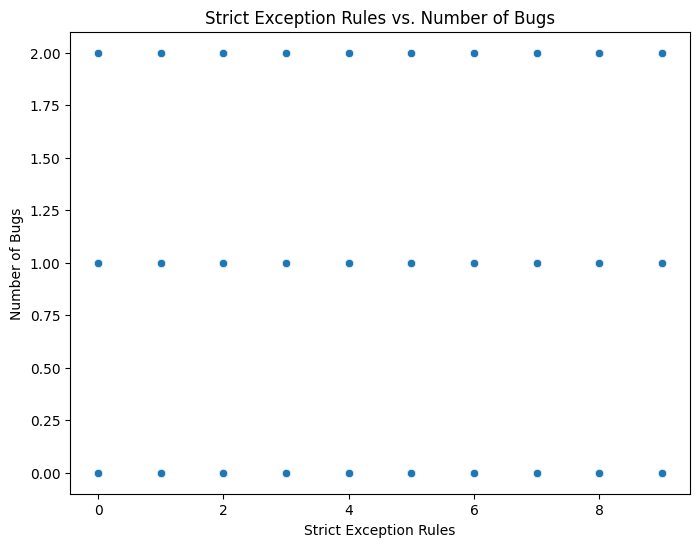

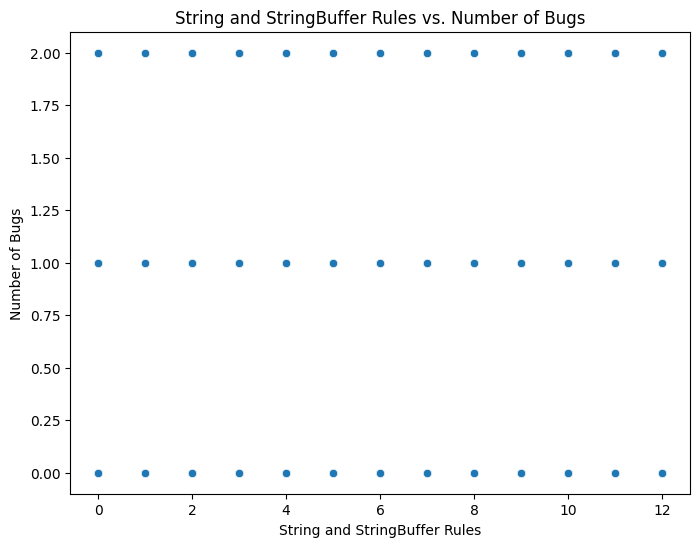

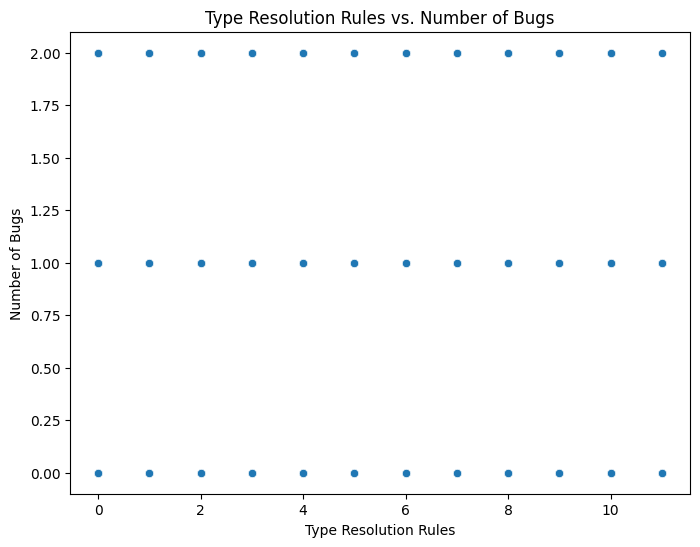

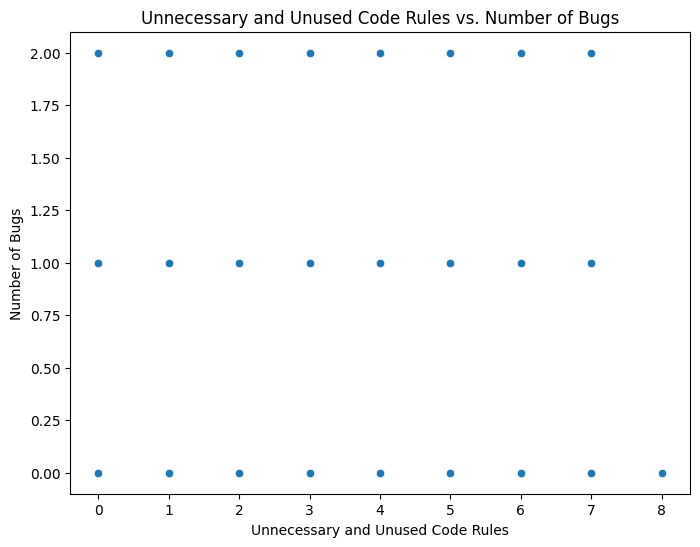

In [27]:
target = 'Number of Bugs'
numerical.remove(target)  # Removing target variable

for column in numerical:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=classes, x=column, y=target)
    plt.title(f'{column} vs. Number of Bugs')
    plt.xlabel(column)
    plt.ylabel('Number of Bugs')
    plt.show()


### Correlation Matrix for Numerical Variables:

In [28]:
correlation = classes[numerical + ['Number of Bugs']].corr()


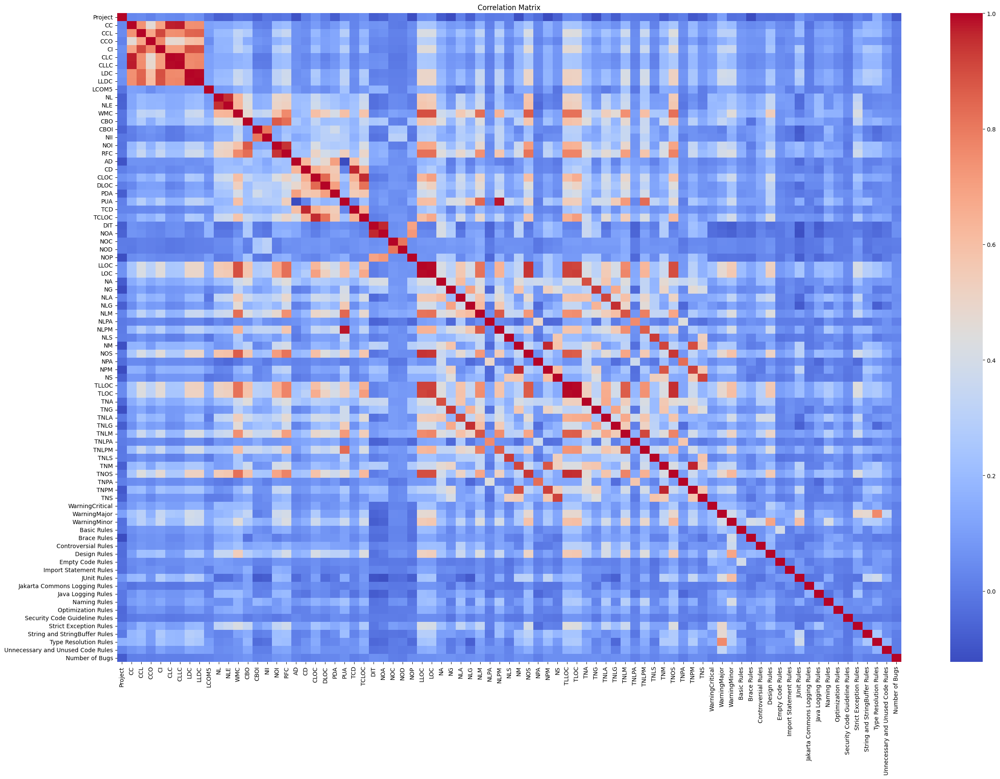

In [29]:
plt.figure(figsize=(30, 20))
sns.heatmap(correlation, annot=False, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.savefig('heatmap_plot.jpg', format='jpg')
plt.show()


### Skewness and Kurtosis of `target` variable.

In [30]:
print("Skewness: %f" % classes['Number of Bugs'].skew())
print("Kurtosis: %f" % classes['Number of Bugs'].kurt())


Skewness: 0.819617
Kurtosis: -0.483179


In [31]:
from scipy.stats import skew, kurtosis

for column in numerical:
  skewness = skew(classes[column].dropna())
  kurt = kurtosis(classes[column].dropna())
  print(f'{column}\t\t\t Skewness: {skewness:.2f}, Kurtosis: {kurt:.2f}')


Project			 Skewness: 1.30, Kurtosis: 0.69
CC			 Skewness: 2.47, Kurtosis: 5.29
CCL			 Skewness: 4.53, Kurtosis: 33.72
CCO			 Skewness: 38.28, Kurtosis: 2918.70
CI			 Skewness: 6.36, Kurtosis: 86.68
CLC			 Skewness: 2.45, Kurtosis: 5.28
CLLC			 Skewness: 2.40, Kurtosis: 4.97
LDC			 Skewness: 4.45, Kurtosis: 28.45
LLDC			 Skewness: 4.29, Kurtosis: 26.20
LCOM5			 Skewness: 2.37, Kurtosis: 6.87
NL			 Skewness: 1.10, Kurtosis: 1.05
NLE			 Skewness: 0.79, Kurtosis: -0.15
WMC			 Skewness: 2.45, Kurtosis: 8.64
CBO			 Skewness: 1.55, Kurtosis: 2.67
CBOI			 Skewness: 6.75, Kurtosis: 59.47
NII			 Skewness: 8.37, Kurtosis: 96.95
NOI			 Skewness: 1.95, Kurtosis: 4.68
RFC			 Skewness: 1.67, Kurtosis: 3.16
AD			 Skewness: 1.75, Kurtosis: 1.97
CD			 Skewness: 1.34, Kurtosis: 0.99
CLOC			 Skewness: 4.11, Kurtosis: 21.76
DLOC			 Skewness: 5.06, Kurtosis: 33.31
PDA			 Skewness: 4.09, Kurtosis: 25.37
PUA			 Skewness: 2.44, Kurtosis: 7.56
TCD			 Skewness: 1.40, Kurtosis: 1.24
TCLOC			 Skewness: 3.90, Kurto

<ipython-input-32-f0a154c52567>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Column', y='Skewness', data=df_skew_kurt, palette='viridis')


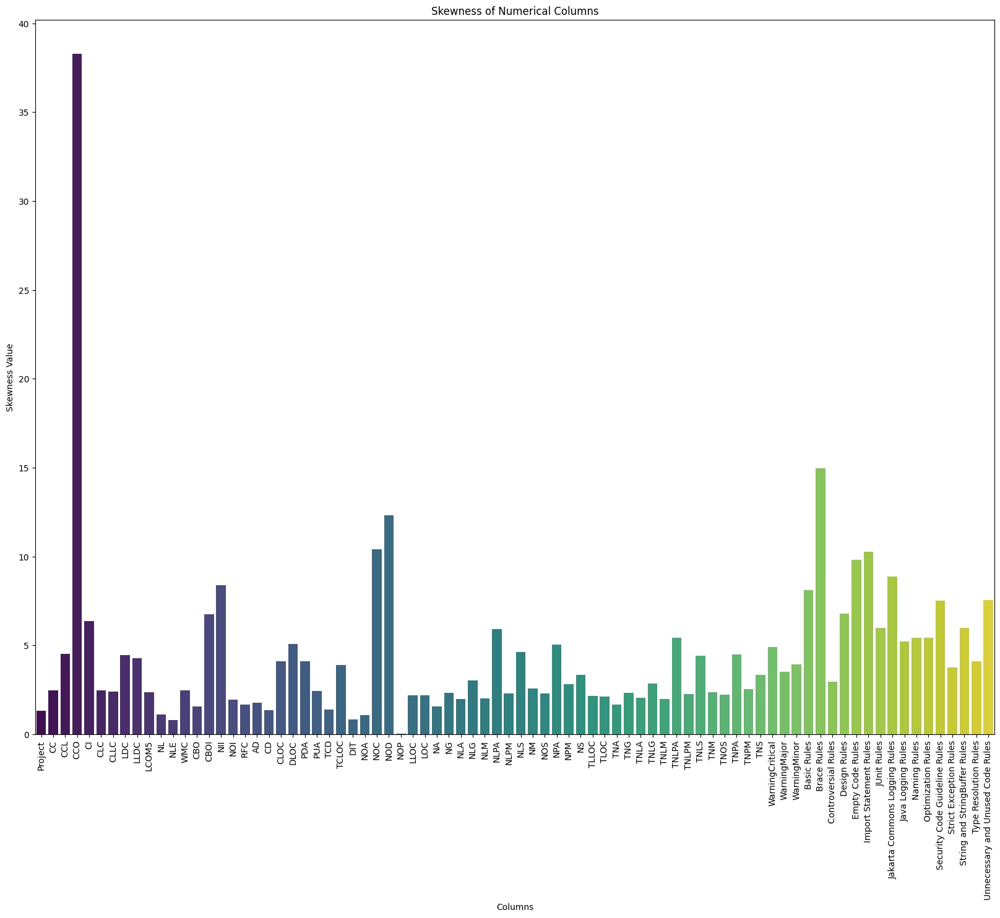

<ipython-input-32-f0a154c52567>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Column', y='Kurtosis', data=df_skew_kurt, palette='plasma')


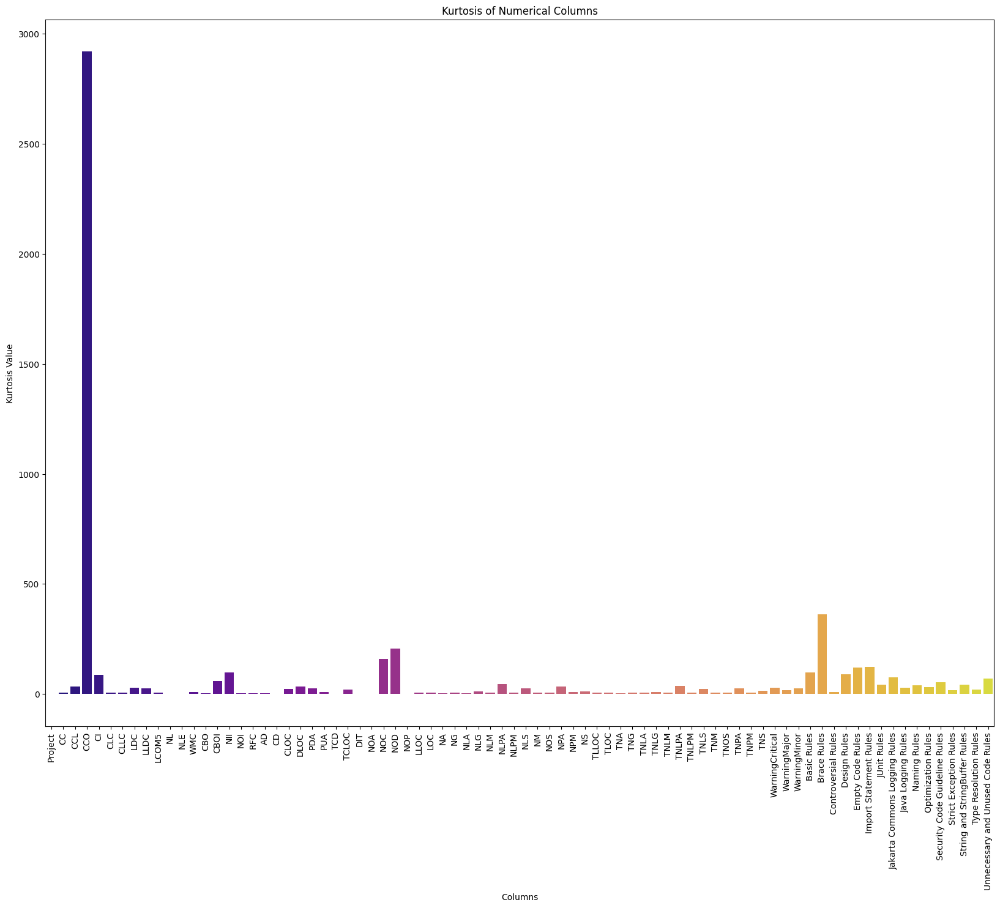

In [32]:
skewness_values = classes[numerical].skew()
kurtosis_values = classes[numerical].kurtosis()
column_names = classes[numerical].columns.tolist()

data = {'Column': column_names, 'Skewness': skewness_values, 'Kurtosis': kurtosis_values}
df_skew_kurt = pd.DataFrame(data)

# Plotting skewness
plt.figure(figsize=(20, 15))
sns.barplot(x='Column', y='Skewness', data=df_skew_kurt, palette='viridis')
plt.title('Skewness of Numerical Columns')
plt.xlabel('Columns')
plt.ylabel('Skewness Value')
plt.xticks(rotation=90)
plt.show()

# Plotting kurtosis
plt.figure(figsize=(20, 15))
sns.barplot(x='Column', y='Kurtosis', data=df_skew_kurt, palette='plasma')
plt.title('Kurtosis of Numerical Columns')
plt.xlabel('Columns')
plt.ylabel('Kurtosis Value')
plt.xticks(rotation=90)
plt.show()


In [33]:
# remove these columns as they have high skewness and kurtosis in the dataset
columns_to_exclude = ['CCO', 'Brace Rules']

for df in [classes, files, methodp, method]:
  df.drop(columns=columns_to_exclude, errors='ignore', inplace=True)

print(classes.shape)
print(files.shape)
print(methodp.shape)
print(method.shape)


(31771, 80)
(60278, 8)
(64599, 48)
(64599, 47)


## Model

### Refining the dataset and build it for model training

In [34]:
x=classes.drop(columns=target)
x = x.drop(columns=['Hash'])
y=classes[target]

print(x.shape)
print(y.shape)


(31771, 78)
(31771,)


#### Normalize the dataset

In [35]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()
x=scaler.fit_transform(x)
x=pd.DataFrame(x)
display(x)


,0,1,2,3,4,5,6,7,8,9,...,68,69,70,71,72,73,74,75,76,77
0,0.111111,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.222222,0.125,...,0.0,0.0,0.0,0.45,0.0,0.0,0.0,0.000000,0.000000,0.00
1,0.111111,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.111111,0.375,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00
2,0.111111,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.111111,0.375,...,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.000000,0.000000,0.25
3,0.111111,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.111111,0.000,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00
4,0.111111,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.125,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31766,1.000000,0.063313,0.043478,0.039216,0.064202,0.07059,0.09622,0.09319,0.111111,0.625,...,0.0,0.0,0.0,0.15,0.0,0.0,1.0,0.083333,0.000000,0.00
31767,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00
31768,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.111111,0.000,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00
31769,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.111111,0.000,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.000000,0.00


In [36]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, random_state=42)

print('Training set:', xtrain.shape, ytrain.shape)
print('Testing set:', xtest.shape, ytest.shape)


Training set: (25416, 78) (25416,)
Testing set: (6355, 78) (6355,)


### Applying PCA to reduce the number of features

In [37]:
from sklearn.decomposition import PCA

pca = PCA(n_components=78).fit(xtrain)
evr = pca.explained_variance_ratio_
evr


array([2.30425280e-01, 1.33863201e-01, 9.10196024e-02, 7.45872589e-02,
       6.29948561e-02, 4.85274310e-02, 3.74657782e-02, 3.36794401e-02,
       2.61215256e-02, 2.23648331e-02, 1.86073119e-02, 1.80016220e-02,
       1.64627407e-02, 1.48034228e-02, 1.22779528e-02, 1.20489442e-02,
       1.15242581e-02, 1.12291843e-02, 1.03521050e-02, 9.37946555e-03,
       8.76500348e-03, 7.87386823e-03, 7.42178219e-03, 6.85752035e-03,
       6.44602218e-03, 6.21645107e-03, 5.18546237e-03, 4.51648394e-03,
       4.23733617e-03, 3.79977626e-03, 3.35327089e-03, 3.04946528e-03,
       2.62043923e-03, 2.42523097e-03, 2.21702254e-03, 2.15548676e-03,
       2.00694677e-03, 1.89426465e-03, 1.81111266e-03, 1.74911319e-03,
       1.64350660e-03, 1.61600330e-03, 1.50512263e-03, 1.38360012e-03,
       1.29484974e-03, 1.23613203e-03, 1.12973256e-03, 1.09448900e-03,
       8.92277935e-04, 8.22775559e-04, 7.80476689e-04, 7.73220497e-04,
       6.63075467e-04, 6.35084777e-04, 4.99955798e-04, 4.64989814e-04,
      

First component to reach 95% explained variance: 29


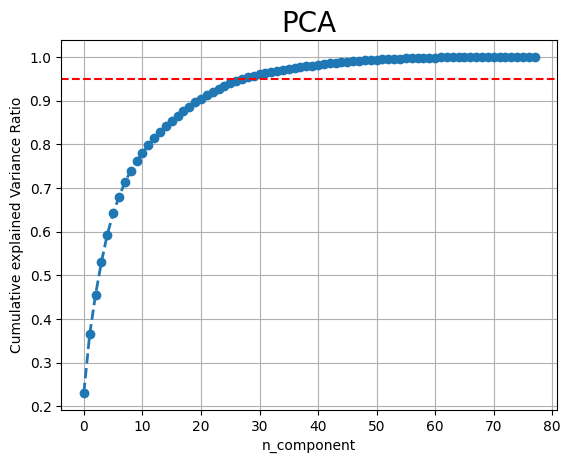

In [38]:
plt.plot(np.cumsum(evr), linewidth=2, marker = 'o', linestyle = '--')
plt.title("PCA", fontsize=20)
plt.xlabel('n_component')
plt.ylabel('Cumulative explained Variance Ratio')
plt.grid(True)

cumulative_variance = np.cumsum(evr)
# Adding a horizontal line for 95% explained variance
target_variance_ratio = 0.95
plt.axhline(y=target_variance_ratio, color='r', linestyle='--', label='95% Explained Variance')

first_component_index_95 = next(i for i, ratio in enumerate(cumulative_variance) if ratio >= target_variance_ratio)
print(f"First component to reach 95% explained variance: {first_component_index_95 + 1}")

plt.savefig('pca.jpg', format='jpg')
plt.show()


In [39]:
from sklearn.decomposition import IncrementalPCA

xtrain_pca = IncrementalPCA(n_components=(first_component_index_95 + 1)).fit_transform(xtrain)
xtrain = xtrain_pca
xtrain


array([[ 0.2581035 ,  0.69413349,  0.07545685, ...,  0.00780474,
         0.00619566,  0.01120535],
       [-0.28106895,  0.17548845, -0.2302895 , ..., -0.0217718 ,
         0.02253964, -0.0249829 ],
       [ 0.88075556,  0.51383534, -1.05953854, ..., -0.22449225,
         0.08468104, -0.00733001],
       ...,
       [-0.82427785, -0.21896917, -0.16472535, ..., -0.0035194 ,
         0.00696831, -0.0248315 ],
       [-0.24365075, -0.16120998,  0.06207976, ..., -0.01203811,
        -0.01044047, -0.01535897],
       [-0.30424101,  0.70192623,  0.07951122, ..., -0.03743681,
        -0.06924243, -0.01546819]])

In [40]:
xtest_pca = IncrementalPCA(n_components=(first_component_index_95 + 1)).fit_transform(xtest)
xtest = xtest_pca
display(xtest)


array([[ 1.12247502e+00,  3.52935978e-02, -5.05724546e-01, ...,
         4.92042065e-02, -8.83366276e-02,  2.30522294e-01],
       [-8.67898173e-02, -1.18433545e-01,  7.95685556e-02, ...,
         1.64299241e-02, -6.85981750e-03,  1.18678512e-02],
       [ 2.23036146e-01,  2.72258114e-01,  6.52503918e-02, ...,
         4.09592506e-02, -1.98488350e-02, -1.98003119e-02],
       ...,
       [-4.80715992e-01, -4.68858649e-01,  9.22207925e-02, ...,
        -1.38271642e-02, -1.43281320e-02,  3.18060236e-02],
       [-8.42395551e-01, -1.89919092e-01, -1.58638227e-01, ...,
        -2.30605099e-03, -6.06509781e-03, -1.99760299e-04],
       [ 4.12984780e-01,  2.15647495e-01,  8.36902935e-03, ...,
         5.44387478e-02, -3.12498948e-02, -5.31700782e-02]])

In [41]:
print(xtrain.shape)
print(xtest.shape)


(25416, 29)
(6355, 29)


In [42]:
ytrain = ytrain.values.reshape(-1)
ytest = ytest.values.reshape(-1)

print(ytrain.shape)
print(ytest.shape)


(25416,)
(6355,)


### Start Building the models

In [43]:
from sklearn.linear_model import LinearRegression, ElasticNet, SGDRegressor, LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from xgboost.sklearn import XGBRegressor

from xgboost import XGBClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import VotingClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier
from lightgbm import LGBMClassifier


#### Create a DataFrame to store the accuracies of the different models

In [44]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix, accuracy_score

results = pd.DataFrame(columns=['Model', 'MSE_train', 'R2_train', 'MSE_test', 'R2_test'])


#### Regressor Models

##### Linear Regression Model

In [45]:
lr = LinearRegression()
lr.fit(xtrain, ytrain)


LinearRegression()

In [46]:
ypred_train = lr.predict(xtrain)
ypred_test = lr.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['Linear Regression', mse_train, r2_train, mse_test, r2_test]


##### Elastic Net Regressor Model

In [47]:
elastic = ElasticNet()
elastic.fit(xtrain, ytrain)


ElasticNet()

In [48]:
ypred_train = elastic.predict(xtrain)
ypred_test = elastic.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['Elastic Net Regression', mse_train, r2_train, mse_test, r2_test]


##### SGD Regressor Model

In [49]:
sgd = SGDRegressor()
sgd.fit(xtrain, ytrain)


SGDRegressor()

In [50]:
ypred_train = sgd.predict(xtrain)
ypred_test = sgd.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['SGD Regression', mse_train, r2_train, mse_test, r2_test]


##### Decision Tree Regression Model

In [51]:
dtr = DecisionTreeRegressor()
dtr.fit(xtrain, ytrain)


DecisionTreeRegressor()

In [52]:
ypred_train = dtr.predict(xtrain)
ypred_test = dtr.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['Decision Tree Regression', mse_train, r2_train, mse_test, r2_test]


##### XG Boost Regression Model

In [53]:
xgb = XGBRegressor()
xgb.fit(xtrain, ytrain)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [54]:
ypred_train = xgb.predict(xtrain)
ypred_test = xgb.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['XG Boost Regression', mse_train, r2_train, mse_test, r2_test]


##### Logistic Regression

In [55]:
log = LogisticRegression(max_iter = 500)
log.fit(xtrain, ytrain)


LogisticRegression(max_iter=500)

In [56]:
ypred_train = log.predict(xtrain)
ypred_test = log.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['Logistic Regression', mse_train, r2_train, mse_test, r2_test]


#### Classifier Models

##### LGBM Multi Class Classifier Model

In [57]:
LGBM = LGBMClassifier(objective='multiclass')
LGBM.fit(xtrain, ytrain)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7395
[LightGBM] [Info] Number of data points in the train set: 25416, number of used features: 29
[LightGBM] [Info] Start training from score -0.596893
[LightGBM] [Info] Start training from score -1.057677
[LightGBM] [Info] Start training from score -2.280637


LGBMClassifier(objective='multiclass')

In [58]:
ypred_train = LGBM.predict(xtrain)
ypred_test = LGBM.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

accuracy = accuracy_score(ytest, ypred_test)

results.loc[len(results)] = ['LGBM Classifier', mse_train, r2_train, mse_test, r2_test]


Accuracy is: 53.958%


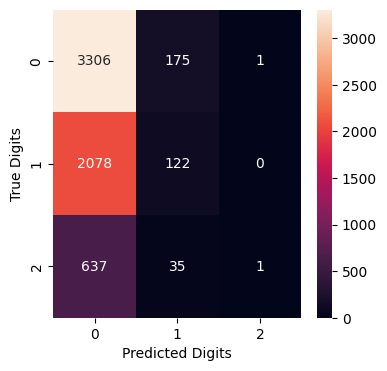

In [59]:
print("Accuracy is: {0:.3f}%".format(accuracy * 100))
cm = confusion_matrix(ytest, ypred_test)
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='.0f')
plt.xlabel("Predicted Digits")
plt.ylabel("True Digits")
plt.show()


##### MLP Classifier

In [60]:
mlp = MLPClassifier(hidden_layer_sizes=(100,50), max_iter=300, random_state=42)
mlp.fit(xtrain, ytrain)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=300, random_state=42)

In [61]:
ypred_train = mlp.predict(xtrain)
ypred_test = mlp.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

accuracy = accuracy_score(ytest, ypred_test)

results.loc[len(results)] = ['MLP Classifier', mse_train, r2_train, mse_test, r2_test]


Accuracy is: 48.120%


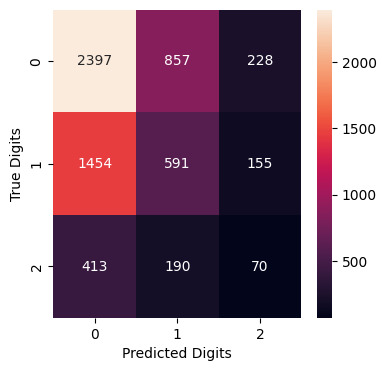

In [62]:
print("Accuracy is: {0:.3f}%".format(accuracy * 100))
cm = confusion_matrix(ytest, ypred_test)
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='.0f')
plt.xlabel("Predicted Digits")
plt.ylabel("True Digits")
plt.show()


##### XGB Multi boosting Classifier Model

In [63]:
XGB = XGBClassifier(objective='multi:softmax')
XGB.fit(xtrain, ytrain)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softmax', ...)

In [64]:
ypred_train = XGB.predict(xtrain)
ypred_test = XGB.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

accuracy = accuracy_score(ytest, ypred_test)

results.loc[len(results)] = ['XG Boost Classifier', mse_train, r2_train, mse_test, r2_test]


Accuracy is: 52.321%


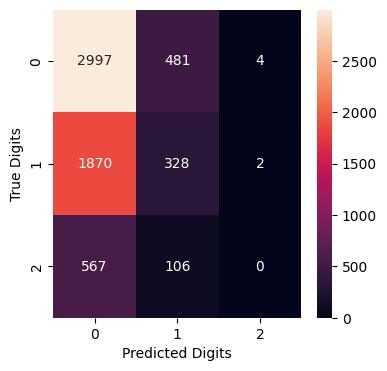

In [65]:
print("Accuracy is: {0:.3f}%".format(accuracy * 100))
cm = confusion_matrix(ytest, ypred_test)
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='.0f')
plt.xlabel("Predicted Digits")
plt.ylabel("True Digits")
plt.show()


#### Deep Neural Network Model

In [66]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense

model = Sequential()
model.add(Dense(256, activation='relu', input_dim=xtrain.shape[1],))
model.add(Dense(128, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='linear'))

model.compile(optimizer="adam", loss='mean_squared_error', metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               7680      
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dense_3 (Dense)             (None, 64)                8256      
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 32)                1056      
                                                                 
 dense_6 (Dense)             (None, 16)                5

In [67]:
model.fit(xtrain, ytrain, epochs=200, batch_size=32, validation_data=(xtest, ytest))


Epoch 1/200
795/795 [==============================] - 5s 4ms/step - loss: 0.4512 - accuracy: 0.4333 - val_loss: 0.4528 - val_accuracy: 0.3800
Epoch 2/200
795/795 [==============================] - 4s 5ms/step - loss: 0.4440 - accuracy: 0.4378 - val_loss: 0.4515 - val_accuracy: 0.3819
Epoch 3/200
795/795 [==============================] - 2s 3ms/step - loss: 0.4404 - accuracy: 0.4411 - val_loss: 0.4508 - val_accuracy: 0.4316
Epoch 4/200
795/795 [==============================] - 2s 3ms/step - loss: 0.4370 - accuracy: 0.4468 - val_loss: 0.4512 - val_accuracy: 0.4499
Epoch 5/200
795/795 [==============================] - 2s 3ms/step - loss: 0.4340 - accuracy: 0.4526 - val_loss: 0.4511 - val_accuracy: 0.4387
Epoch 6/200
795/795 [==============================] - 3s 4ms/step - loss: 0.4314 - accuracy: 0.4594 - val_loss: 0.4517 - val_accuracy: 0.4411
Epoch 7/200
795/795 [==============================] - 4s 5ms/step - loss: 0.4276 - accuracy: 0.4703 - val_loss: 0.4583 - val_accuracy: 0.4175

##### Evaluate the accuracy of the DNN model

In [68]:
eval = model.evaluate(xtest, ytest)

print(f"Test Loss: {eval[0]}")
print(f"Test Accuracy: {eval[1]}")


199/199 [==============================] - 0s 2ms/step - loss: 0.5784 - accuracy: 0.4656
Test Loss: 0.5783823728561401
Test Accuracy: 0.4656176269054413


In [69]:
ypred_train = model.predict(xtrain)
ypred_test = model.predict(xtest)

mse_train = mean_squared_error(ytrain, ypred_train)
r2_train = r2_score(ytrain, ypred_train)

mse_test = mean_squared_error(ytest, ypred_test)
r2_test = r2_score(ytest, ypred_test)

results.loc[len(results)] = ['Deep NN', mse_train, r2_train, mse_test, r2_test]


199/199 [==============================] - 0s 2ms/step


## Now, Let's watch accuracies of all the models in the increasing order of testing MSE

In [70]:
results = results.sort_values(by='MSE_test', ascending=True)
results


,Model,MSE_train,R2_train,MSE_test,R2_test
0,Linear Regression,0.443452,0.018401,0.452234,0.013536
2,SGD Regression,0.443768,0.017702,0.452410,0.013152
1,Elastic Net Regression,0.451765,0.000000,0.458479,-0.000086
4,XG Boost Regression,0.270672,0.400858,0.487303,-0.062960
9,Deep NN,0.262022,0.420003,0.578382,-0.261633
8,XG Boost Classifier,0.408444,0.095894,0.746341,-0.628005
6,LGBM Classifier,0.601353,-0.331119,0.761605,-0.661299
5,Logistic Regression,0.747010,-0.653535,0.762707,-0.663702
7,MLP Classifier,0.556185,-0.231137,0.821400,-0.791732
3,Decision Tree Regression,0.125428,0.722360,0.897956,-0.958724


<ipython-input-71-7e15e17a1cce>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='MSE_test', y='Model', data=results, ax=axes[0], palette='viridis')
<ipython-input-71-7e15e17a1cce>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='R2_test', y='Model', data=results, ax=axes[1], palette='viridis')


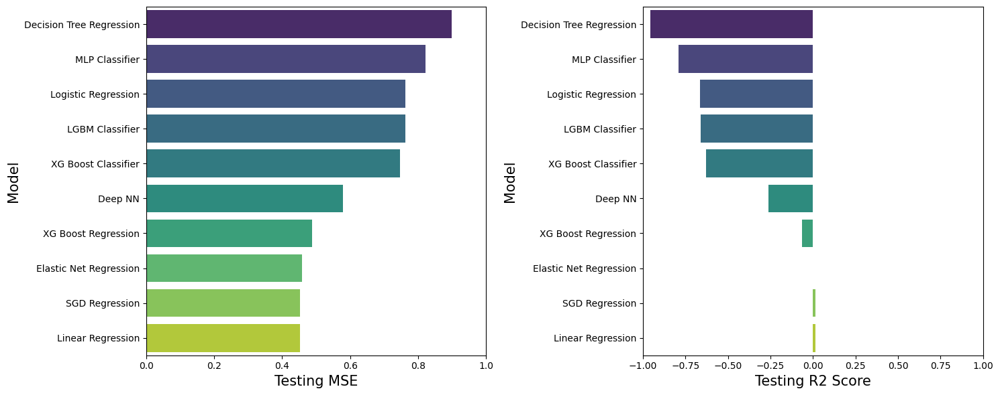

In [71]:
results.sort_values(by=['MSE_test'], ascending=False, inplace=True)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plotting Testing MSE
sns.barplot(x='MSE_test', y='Model', data=results, ax=axes[0], palette='viridis')
axes[0].set_xlabel('Testing MSE', size=15)
axes[0].set_ylabel('Model', size=15)
axes[0].set_xlim(0, 1)

# Plotting R2 scores
sns.barplot(x='R2_test', y='Model', data=results, ax=axes[1], palette='viridis')
axes[1].set_xlabel('Testing R2 Score', size=15)
axes[1].set_ylabel('Model', size=15)
axes[1].set_xlim(-1, 1)

plt.savefig('MSE_R2_plot.png', bbox_inches='tight')
plt.tight_layout()
plt.show()


- Here we can see that R2 Score and Mean Absolute Error is best for Linear Regression Model.

## Bug Hunter Analysis Model Completed with best fits for Linear Regressor and SGD Regressor.